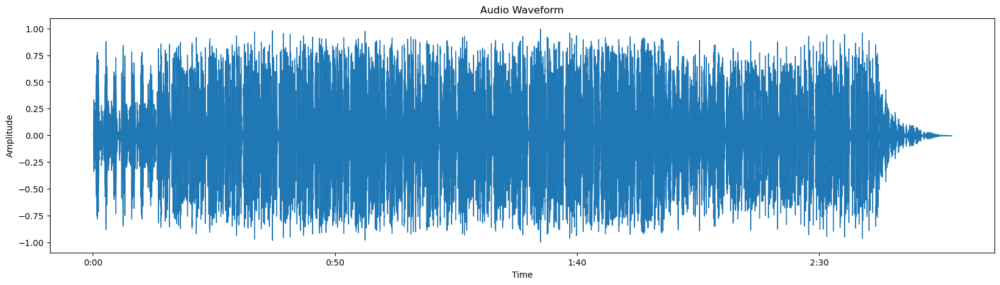

[[3.3302284e-16 6.5036079e-15 1.5697831e-06 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [3.3025899e-16 6.3539702e-15 3.0291342e-06 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [3.2204791e-16 5.8182494e-15 5.3926651e-06 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 ...
 [2.8423408e-16 4.4872837e-15 1.8178584e-07 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [2.8649198e-16 2.4201917e-15 1.8538059e-07 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]
 [2.8725293e-16 4.5491509e-16 1.8672887e-07 ... 0.0000000e+00
  0.0000000e+00 0.0000000e+00]]


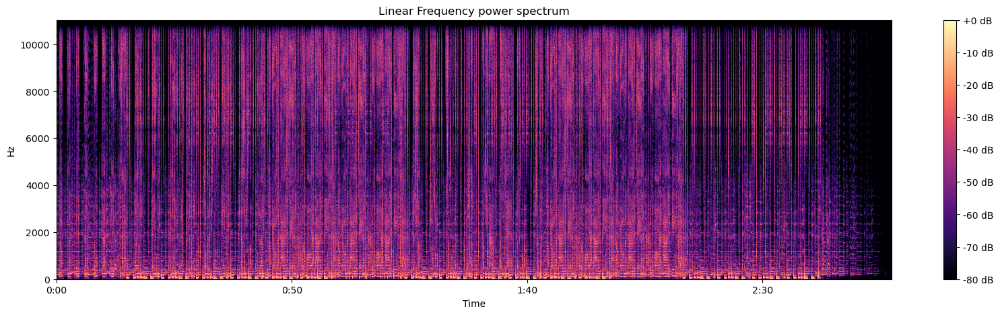

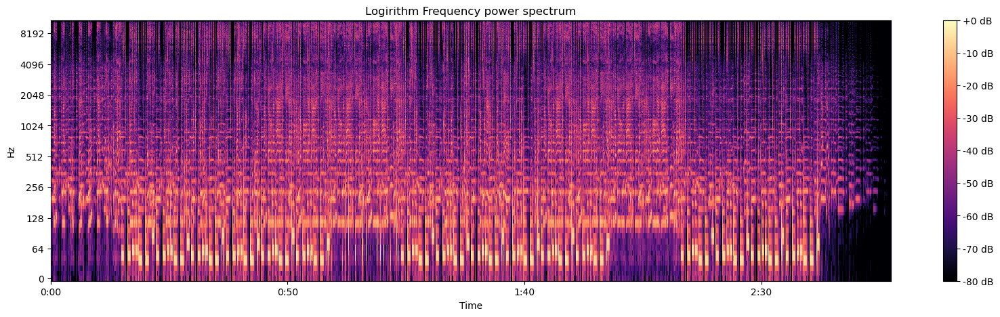

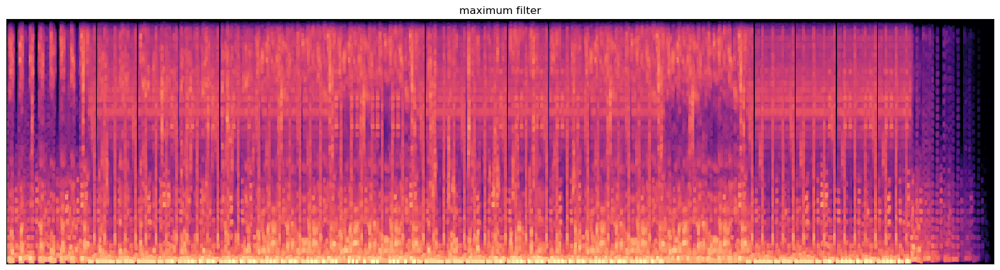

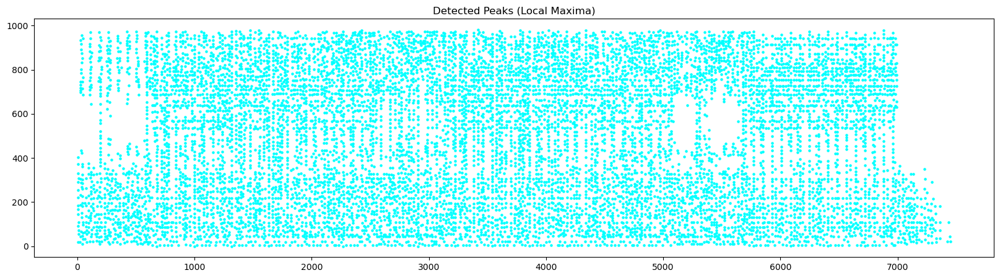

In [118]:
'''
for visualisation stuff
'''
import os
import audioPreprocess
import librosa
import IPython.display as ipd
import numpy as np
import pandas as pd
import librosa.display
import matplotlib.pyplot as plt
from scipy import ndimage

class visualisation:
    y = 0
    sr = []
    def __init__(self):
        pass
    #can create some different visualization to learn more about the audio you have
    @classmethod
    def audioVisualization(clss,*kwargs):
        filePath = [file for file in os.listdir(os.path.join(audioPreprocess.audioPreprocess.audioMetadataPath[0],audioPreprocess.audioPreprocess.audioMetadataPath[1]))]

        filePath = list(filter(lambda a: a != "metadata",filePath))
        filePath = list(map(lambda a: os.path.join(audioPreprocess.audioPreprocess.audioMetadataPath[0],audioPreprocess.audioPreprocess.audioMetadataPath[1])+"\\"+a,filePath))
        #C:\\Users\\benja\\Downloads\\Yungeen Ace - Who Ready (Official Music Video) [ ezmp3.cc ].mp3
        y, sr = librosa.load(filePath[1])#filePath[1])
        ipd.display(ipd.Audio(y,rate=sr))
        plt.figure(figsize=(20,5))
        librosa.display.waveshow(y,sr=sr)
        plt.title("Audio Waveform")
        plt.xlabel("Time")
        plt.ylabel("Amplitude")
        plt.show()

        #compute the spectrogram
        D = np.abs(librosa.stft(y,n_fft=2048,hop_length=512))
        print(D)
        #convert to db scale
        #np.abs(D)
        s_db = librosa.amplitude_to_db(np.abs(D),ref=np.max)
        #s_db = librosa.amplitude_to_db(D, ref=np.percentile(D, 95))
        #print(s_db)
        #display Linear Frequency power spectrum

        plt.figure(figsize=(20,5))
        librosa.display.specshow(s_db, sr=sr, x_axis='time', y_axis='hz')
        #librosa.display.specshow(s_db,sr=sr,x_axis="time",y_axis='hz')#,sr=sr,x_axis="time",y_axis="hz",cmap='magma')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Linear Frequency power spectrum')
        plt.show()   


        #display Log Frequency power spectrum
        plt.figure(figsize=(20,5))
        librosa.display.specshow(s_db, sr=sr, x_axis='time', y_axis='log')
        #librosa.display.specshow(s_db,sr=sr,x_axis="time",y_axis='hz')#,sr=sr,x_axis="time",y_axis="hz",cmap='magma')
        plt.colorbar(format='%+2.0f dB')
        plt.title('Logirithm Frequency power spectrum')
        plt.show()            

        #Next steps will be to find peaks within the spectrogram. Now there are two options we will use:
        #2.) Will be using the maximum filter technique, which is an image processing technique. Can use scipy
        neighborhood_size = 20
        local_max = ndimage.maximum_filter(s_db, size=neighborhood_size)
        plt.figure(figsize=(20,5))
        librosa.display.specshow(local_max, sr=sr)
        plt.title("maximum filter")
        plt.show()

        #After applying filter, next step is to get those peaks
        peak = s_db == local_max
        # Keep only strong peaks (above a loudness threshold)
        amplitude_threshold = -40  # adjust as needed
        peak = peak & (s_db > amplitude_threshold)
        plt.figure(figsize=(20,5))
        #plt.imshow(s_db, origin='lower', cmap='magma', aspect='auto')
        plt.scatter(np.where(peak)[1], np.where(peak)[0], color='cyan', s=5)
        plt.title("Detected Peaks (Local Maxima)")
        plt.show()

visualisation.audioVisualization()